Notes
- The same library was sequenced twice on the AVITI. The first, on 2023-12-04, was largely a "failed" run with extremely low read count and poor read quality scores. Hence, the entire library pool was re-sequenced on 2023-12-08.
- Goals
  1. Barcode count distributions
  2. Ligation efficiency - relative amounts of Oligo+Y vs. Oligo+R1+Y vs. ... vs. Oligo+R1+R2+R3+Y

# Setup

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext watermark

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
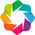

In [2]:
import collections
import gzip
import itertools
import json
import os
import re
import subprocess
import sys
import numpy as np
import scipy
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')
from tqdm.auto import tqdm

sys.path.append('../scripts')
import string_distances
import helpers
import plot_features

In [3]:
%watermark
%watermark --conda
%watermark --iversions

Last updated: 2024-01-06T16:39:08.041671-08:00

Python implementation: CPython
Python version       : 3.10.12
IPython version      : 8.14.0

Compiler    : GCC 12.3.0
OS          : Linux
Release     : 3.10.0-1160.53.1.el7.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 32
Architecture: 64bit

conda environment: py3

scipy     : 1.11.1
json      : 2.0.9
pandas    : 2.0.2
sys       : 3.10.12 | packaged by conda-forge | (main, Jun 23 2023, 22:40:32) [GCC 12.3.0]
seaborn   : 0.12.2
plotly    : 5.15.0
numpy     : 1.23.5
matplotlib: 3.7.2
holoviews : 1.17.0
re        : 2.2.1



In [4]:
DIR_PROJECT = '/central/groups/guttman/btyeh/scBarcode'
DIR_DATA = os.path.join(DIR_PROJECT, 'data', '20231208')
DIR_AUX = os.path.join(DIR_PROJECT, 'data_aux', '20231208')
DIR_PROC = os.path.join(DIR_PROJECT, 'data_proc', '20231208')
DIR_RESULTS = os.path.join(DIR_PROJECT, 'results', '20231208')
# DIR_DATA_1 = os.path.join(DIR_PROJECT, 'data', '20231204')
# DIR_AUX = os.path.join(DIR_PROJECT, 'data_aux', '20231204')
# DIR_PROC_1 = os.path.join(DIR_PROJECT, 'data_proc', '20231204')
# DIR_RESULTS_1 = os.path.join(DIR_PROJECT, 'results', '20231204')

os.makedirs(DIR_AUX, exist_ok=True)
os.makedirs(DIR_PROC, exist_ok=True)
os.makedirs(DIR_RESULTS, exist_ok=True)

# Constants and Helpers

In [5]:
ROUNDS = ['R1', 'R2', 'R3', 'Y']

In [6]:
dict_complement = {'A': 'T', 'T': 'A', 'C': 'G', 'G': 'C', 'N': 'N'}
def reverse_complement(s, allow_noncanonical=False):
    if allow_noncanonical is False:
        return ''.join(dict_complement[base] for base in reversed(s))
    else:
        return ''.join(dict_complement.get(base, base) for base in reversed(s))

# Data

- [Enhanced Sample Sheet](https://docs.google.com/spreadsheets/d/1mykwPx2yhmo0AwmW5-jT6n4OxP4uvRGfa7T5gqjKeH8/)
- [Library sheet](https://docs.google.com/spreadsheets/d/1NeARoDSZU0c5SxCTj2-0UxUu3JVUmXzFHPPD1xkGmKM/)
- [Benchling notebook: 2023-11-29 Single Cell Barcode Troubleshooting, v4 (terminal tag vs. EDTA quench)](https://benchling.com/s/etr-3bKIM8CScL814XrVEUBG)

In [7]:
regex_fastq_files = re.compile((
    r'(?P<filename>scBarcode-(?P<basename>(?P<quench>EDTA|NY)_(?P<sample>.*))_R(?P<read>1|2).fastq.gz)'))

In [8]:
files_fastq = sorted([file for file in os.listdir(DIR_DATA) if file.endswith('.fastq.gz')])
df_data = pd.DataFrame([
    regex_fastq_files.match(file).groupdict() for file in files_fastq]) \
    .astype(dict(read=int))

In [9]:
popen_counts = dict()
for sample, group in df_data.groupby('sample'):
    filename = group.loc[group['read'] == 1, 'filename'].item()
    cmd = "unpigz -c {path_fastq_raw} | wc -l | awk '{{print $1 / 4}}'".format(path_fastq_raw=os.path.join(DIR_DATA, filename))
    popen_counts[sample] = subprocess.Popen(cmd, shell=True, stdin=subprocess.PIPE, stdout=subprocess.PIPE)

In [10]:
df_data['n_reads'] = int(0)
for sample, popen in popen_counts.items():
    count, err = popen.communicate()
    assert err is None and popen.returncode == 0
    df_data.loc[df_data['sample'] == sample, 'n_reads'] = int(count.decode().strip())

In [11]:
path_library_info = os.path.join(DIR_DATA, '2023-11-30 Amplification and Sequencing of Flow Singlets - Gel Cut.csv')
df_library_info = (
    pd.read_csv(path_library_info)
    .pipe(lambda df: (
        df.assign(basename=df['Sample'].str.replace('scBarcode-', ''))
        .drop(columns=[c for c in df.columns if c.startswith('Unnamed')])
        .loc[~df['Sample'].isna() & df['To Pool']]
        .rename(columns={'Complexity': 'Complexity (Tapestation)'})
        .astype({'Complexity (Tapestation)': int})
    ))
)

In [12]:
# from the library sheet, linked above
df_data = df_data.merge(df_library_info[['basename', 'Complexity (Tapestation)']], how='left')

In [13]:
df_data = df_data.sort_values(['basename', 'read']).reset_index(drop=True)
df_data

,filename,basename,quench,sample,read,n_reads,Complexity (Tapestation)
0,scBarcode-EDTA_A2_R1.fastq.gz,EDTA_A2,EDTA,A2,1,135884,590000
1,scBarcode-EDTA_A2_R2.fastq.gz,EDTA_A2,EDTA,A2,2,135884,590000
2,scBarcode-EDTA_A3_R1.fastq.gz,EDTA_A3,EDTA,A3,1,1257782,3570000
3,scBarcode-EDTA_A3_R2.fastq.gz,EDTA_A3,EDTA,A3,2,1257782,3570000
4,scBarcode-EDTA_B2_R1.fastq.gz,EDTA_B2,EDTA,B2,1,1104986,3770000
5,scBarcode-EDTA_B2_R2.fastq.gz,EDTA_B2,EDTA,B2,2,1104986,3770000
6,scBarcode-EDTA_C3_R1.fastq.gz,EDTA_C3,EDTA,C3,1,513192,1870000
7,scBarcode-EDTA_C3_R2.fastq.gz,EDTA_C3,EDTA,C3,2,513192,1870000
8,scBarcode-EDTA_D2_R1.fastq.gz,EDTA_D2,EDTA,D2,1,1730567,4830000
9,scBarcode-EDTA_D2_R2.fastq.gz,EDTA_D2,EDTA,D2,2,1730567,4830000


In [14]:
print('Total number of paired reads:', df_data['n_reads'].sum() // 2)

Total number of paired reads: 24104736


## Check sequencing depth

Mostly linear relationship between Tapestation-estimated library complexity and number of reads obtained. Only 2 samples from the terminal quench strategy (`C4_lt-220bp` and `D4_lt-220bp`) are moderately undersampled.

In [15]:
fig = px.scatter(
    df_data,
    x='Complexity (Tapestation)',
    y='n_reads',
    color='sample',
    facet_col='quench'
)

# set height to ensure that all samples are shown in legend without need for scrolling
fig.update_layout(height=450, margin=dict(l=10, r=10, b=10, t=20))
fig.show()

# Alternative non-interactive plot using seaborn
# g = sns.relplot(
#     kind='scatter',
#     data=df_data.loc[df_data['read'] == 1],
#     x='Complexity (Tapestation)',
#     y='n_reads',
#     hue='sample',
#     col='quench',
#     facet_kws=dict(sharex=False, sharey=False)
# )

# FastQC

Expectations
- Read 1: good sequence diversity due to UMIs on the oligo
- Read 2: near total duplication from each sample, since all barcodes from the same nucleus should have the same R1, R2, R3, and NYLigOdd tags

In [16]:
%%bash -s {DIR_DATA} {DIR_PROC}
DIR_DATA="$1"
DIR_PROC="$2"
source ~/.bashrc
conda activate chipdip
DIR_FASTQC_OUT="$DIR_PROC/fastqc"
if [ ! -d "$DIR_FASTQC_OUT" ]; then
    mkdir "$DIR_PROC/fastqc"
    cd "$DIR_DATA"
    fastqc *.fastq.gz -t 20 -q -o "$DIR_FASTQC_OUT"
fi

# Check read structure

Expected read structures (see also Benchling DNA sequence: [Oligo (PC50_12merUMI) + R1-R3 + NYLigOdd PCR Product (2Puni + 2Pbc)](https://benchling.com/s/seq-uec4dPutBQPpgn6aNbXV))

| Component                                 | Length | R1 coordinates | R2 coordinates |
| ----------------------------------------- | ------ | -------------- | -------------- |
| 2Puni adapter, remainder                  | 49     | n/a            | 118:167        |
| 2Puni adapter, continued                  | 10     | n/a            | 108:118        |
| 2Puni adapter, Illumina universal adapter | 11     | n/a            | 97-98:108-109  |
| Oligo UMI                                 | 12     | 0:12           | 85-86:97-98    |
| LigEven / Even overhang                   | 7      | 12:19          | 78-79:85-86    |
| R1 unique sequence                        | 16     | 19:35          | 62-63:78-79    |
| LigR1 / R1 overhang                       | 7      | 35:42          | 55-56:62-63    |
| R2 unique sequence                        | 16     | 42:58          | 39-40:55-56    |
| LigR2 / R2 overhang                       | 7      | 58:65          | 32-33:39-40    |
| R3 unique sequence                        | 16     | 65:81          | 16-17:32-33    |
| LigR3 / R3 overhang                       | 7      | 81:88          | 9-10:16-17     |
| NYLigOddStg (rows A-B) unique sequence    | 9-10   | 88:97-98       | 0:9-10         |
| 2Pbc adapter, Illumina universal adapter  | 11     | 97-98:108-109  | n/a            |

Note: see the splitcode config file for the subsequences of the 2Puni and 2Pbc adapters that are identified.

## Analysis by group

In [52]:
path_config = os.path.join(DIR_AUX, 'splitcode_config-groups_only_r1.tsv')

# read config file into pandas DataFrame
# - seek to first line after lines starting with '@' or '#'; 
#     pd.read_csv() only supports a single character comment
# - need to open file as binary to enable f.tell() to work
with open(path_config, 'rb') as f:
    pos = f.tell()
    for line in f:
        line = line.decode().strip()
        if line.startswith('#') or line.startswith('@') or line == '':
            pos = f.tell()
            continue
        f.seek(pos)
        break
    df_config = pd.read_csv(f, sep='\t')

Check that tags do not have collisions

In [53]:
regex_distances = re.compile(r'((?P<dist_hamming>\d+):(?P<dist_indel>\d+):)?(?P<dist_total>\d+)')
variant_maps = dict()
for tag_group in df_config['groups'].unique():
    mask_tag_group = df_config['groups'] == tag_group
    seqs = set(df_config.loc[mask_tag_group, 'tags'])
    distances = df_config.loc[mask_tag_group, 'distances'].unique()
    assert len(distances) == 1
    distances = regex_distances.match(distances[0]).groupdict()
    for k in distances:
        if distances[k] is not None:
            distances[k] = int(distances[k])
    variant_maps[tag_group] = string_distances.generate_variant_map(seqs, **distances, verify_unique=True)

In [54]:
all_variants = set()
for tag_group, variants in variant_maps.items():
    assert len(set(variants.keys()) & all_variants) == 0
    all_variants |= set(variants.keys())

### Parse Read 1

In [58]:
%%bash -s {DIR_DATA} {DIR_PROC} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
PATH_CONFIG="$3"

for path_R1 in "$DIR_DATA"/*R1.fastq.gz; do
    SAMPLE="$(echo "$path_R1" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R1')"
    path_counts="${DIR_PROC}/tag_group_counts-${SAMPLE}.tsv"

    if [ ! -f "$path_counts" ]; then
        splitcode -c "$PATH_CONFIG" \
            --nFastqs=1 --assign --loc-names --no-outb -t 8 \
            --mapping=/dev/null --output=/dev/stdout \
            "$path_R1" |
        awk '$1 ~ /^@/' |
        grep -o "LX:Z:.*" |
        sed -E -e 's/LX:Z://' -e 's/:0,/:/g' |
        sort |
        uniq -c |
        sed -E -e 's/^ *//' -e 's/ /\t/' |
        sort -n -r > "$path_counts"
    fi
done

* Using a list of 203 tags (vector size: 203; map size: 99,765; num elements in map: 100,920)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A2_R1.fastq.gz
* processing the reads ...
done 
* processed 26,090 reads, 24,958 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 99,765; num elements in map: 100,920)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A3_R1.fastq.gz
* processing the reads ...
done 
* processed 80,654 reads, 79,788 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 99,765; num elements in map: 100,920)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_B2_R1.fastq.gz
* processing the reads ...
done 
* processed 35,361 reads, 35,175 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 99,765; num elements in map: 100,920)
* will process sample 1: /central/group

Proportion of reads matching expected structure

In [59]:
%%bash -s {DIR_DATA} {DIR_PROC} {DIR_RESULTS} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
DIR_RESULTS="$3"
PATH_CONFIG="$4"

for path_R1 in "$DIR_DATA"/*R1.fastq.gz; do
    SAMPLE="$(echo "$path_R1" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R1')"
    path_analysis="${DIR_RESULTS}/tag_group_analysis-${SAMPLE}.csv"
    path_counts="${DIR_PROC}/tag_group_counts-${SAMPLE}.tsv"

    total_reads=$(cat "$path_counts" |
        cut -f 1 |
        awk '{sum += $1} END {print sum}')

    echo -n "${SAMPLE},expected structure," > "$path_analysis"
    cat "$path_counts" |
        sed -E -e 's/:[0-9]+-[0-9]+//g' |
        grep -E -e "LigEven,R1Top,LigR1,R2Top,LigR2,R3Top,LigR3,NYLigOddStgTop,Illumina" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},Illumina adapter," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "Illumina" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R1 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R1Top:[0-9]+-([0-9]+),Lig.{2,4}:\1-([0-9]+),R1Top:\2-([0-9]+),LigR1:\3-[0-9]+" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R2 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R2Top:[0-9]+-([0-9]+),Lig.{2,4}:\1-([0-9]+),R2Top:\2-([0-9]+),LigR2:\3-[0-9]+" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R3 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R3Top:[0-9]+-([0-9]+),Lig.{2,4}:\1-([0-9]+),R3Top:\2-([0-9]+),LigR3:\3-[0-9]+" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"
done

In [71]:
df_group_analysis_r1 = []
for sample in df_data['basename'].unique():
    path_analysis = os.path.join(DIR_RESULTS, f'tag_group_analysis-{sample}_R1.csv')
    df_group_analysis_r1.append(pd.read_csv(path_analysis, header=None, names=['sample', 'structure', 'count', 'total']))
df_group_analysis_r1 = (
    pd.concat(df_group_analysis_r1, axis=0)
    .fillna(0)
    .astype(dict(count=int, total=int))
    .pipe(lambda df: df.assign(
        proportion=df['count'] / df['total'],
        sample=df['sample'].str.replace('_R1$', '', regex=True)
    ))
    .merge(df_data[['basename', 'quench']].rename(columns={'basename': 'sample'}))
)

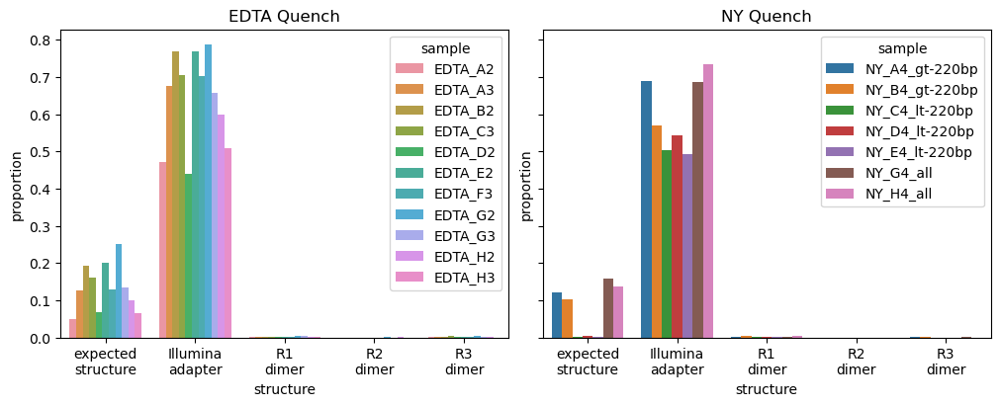

In [78]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4), sharex=False, sharey=True, constrained_layout=True)
sns.barplot(
    df_group_analysis_r1 \
        .assign(structure=df_group_analysis_r1['structure'].str.replace(' ', '\n')) \
        .loc[df_group_analysis_r1['quench'] == 'EDTA'],
    x='structure',
    y='proportion',
    hue='sample',
    ax=axs[0]
)
axs[0].set_title('EDTA Quench')
sns.barplot(
    df_group_analysis_r1 \
        .assign(structure=df_group_analysis_r1['structure'].str.replace(' ', '\n')) \
        .loc[df_group_analysis_r1['quench'] == 'NY'],
    x='structure',
    y='proportion',
    hue='sample',
    ax=axs[1]
)
axs[1].set_title('NY Quench')
fig.show()

#### Check terminal tags used

Used wells A1-B12 from a really old plate --> verify that the wells are in row-major order as expected.

In [96]:
path_config = os.path.join(DIR_AUX, 'splitcode_config-r1_terminal_tags.tsv')

In [97]:
%%bash -s {DIR_DATA} {DIR_PROC} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
PATH_CONFIG="$3"

for path_R1 in "$DIR_DATA"/*R1.fastq.gz; do
    SAMPLE="$(echo "$path_R1" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R1')"
    path_counts="${DIR_PROC}/terminal_tag_counts-${SAMPLE}.tsv"

    splitcode -c "$PATH_CONFIG" \
        --nFastqs=1 --assign --no-outb -t 8 \
        --mapping="$path_counts" --output=/dev/null \
        "$path_R1"
done

* Using a list of 96 tags (vector size: 96; map size: 240; num elements in map: 240)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A2_R1.fastq.gz
* processing the reads ...
done 
* processed 26,090 reads, 5,068 reads were assigned
* Using a list of 96 tags (vector size: 96; map size: 240; num elements in map: 240)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A3_R1.fastq.gz
* processing the reads ...
done 
* processed 80,654 reads, 28,736 reads were assigned
* Using a list of 96 tags (vector size: 96; map size: 240; num elements in map: 240)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_B2_R1.fastq.gz
* processing the reads ...
done 
* processed 35,361 reads, 21,296 reads were assigned
* Using a list of 96 tags (vector size: 96; map size: 240; num elements in map: 240)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/202312

In [99]:
df_terminal_tags_r1 = []
for sample in df_data['basename'].unique():
    path_analysis = os.path.join(DIR_PROC, f'terminal_tag_counts-{sample}_R1.tsv')
    df_terminal_tags_r1.append(
        pd.read_csv(path_analysis, sep='\t', header=None, names=['tag', 'count'], usecols=[1, 2]) \
            .assign(sample=sample)
    )
df_terminal_tags_r1 = pd.concat(df_terminal_tags_r1, axis=0, ignore_index=True)

In [104]:
df_terminal_tags_r1.groupby('tag')['count'].sum().sort_values(ascending=False).head(25)

tag
NYLigOddStgTop_13    173845
NYLigOddStgTop_23    105515
NYLigOddStgTop_20     67158
NYLigOddStgTop_6      51792
NYLigOddStgTop_21     44325
NYLigOddStgTop_7      38680
NYLigOddStgTop_22     28815
NYLigOddStgTop_11     21504
NYLigOddStgTop_15     19296
NYLigOddStgTop_14     13267
NYLigOddStgTop_1       9294
NYLigOddStgTop_16      5040
NYLigOddStgTop_2       1695
NYLigOddStgTop_10       890
NYLigOddStgTop_3        419
NYLigOddStgTop_38       212
NYLigOddStgTop_12       196
NYLigOddStgTop_24       147
NYLigOddStgTop_19       133
NYLigOddStgTop_28        89
NYLigOddStgTop_4         73
NYLigOddStgTop_81        40
NYLigOddStgTop_18        35
NYLigOddStgTop_5         35
NYLigOddStgTop_8         29
Name: count, dtype: int64

### Parse Read 2

In [79]:
path_config = os.path.join(DIR_AUX, 'splitcode_config-groups_only.tsv')

In [80]:
%%bash -s {DIR_DATA} {DIR_PROC} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
PATH_CONFIG="$3"

for path_R2 in "$DIR_DATA"/*R2.fastq.gz; do
    SAMPLE="$(echo "$path_R2" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R2')"
    path_counts="${DIR_PROC}/tag_group_counts-${SAMPLE}.tsv"

    if [ ! -f "$path_counts" ]; then
        splitcode -c "$PATH_CONFIG" \
            --nFastqs=1 --assign --loc-names --no-outb -t 8 \
            --mapping=/dev/null --output=/dev/stdout \
            "$path_R2" |
        awk '$1 ~ /^@/' |
        grep -o "LX:Z:.*" |
        sed -E -e 's/LX:Z://' -e 's/:0,/:/g' |
        sort |
        uniq -c |
        sed -E -e 's/^ *//' -e 's/ /\t/' |
        sort -n -r > "$path_counts"
    fi
done

* Using a list of 203 tags (vector size: 203; map size: 98,012; num elements in map: 99,152)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A2_R2.fastq.gz
* processing the reads ...
done 
* processed 26,090 reads, 24,223 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 98,012; num elements in map: 99,152)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A3_R2.fastq.gz
* processing the reads ...
done 
* processed 80,654 reads, 75,239 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 98,012; num elements in map: 99,152)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_B2_R2.fastq.gz
* processing the reads ...
done 
* processed 35,361 reads, 33,225 reads were assigned
* Using a list of 203 tags (vector size: 203; map size: 98,012; num elements in map: 99,152)
* will process sample 1: /central/groups/gu

Proportion of reads matching expected structure

In [81]:
%%bash -s {DIR_DATA} {DIR_PROC} {DIR_RESULTS} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
DIR_RESULTS="$3"
PATH_CONFIG="$4"

for path_R2 in "$DIR_DATA"/*R2.fastq.gz; do
    SAMPLE="$(echo "$path_R2" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R2')"
    path_analysis="${DIR_RESULTS}/tag_group_analysis-${SAMPLE}.csv"
    path_counts="${DIR_PROC}/tag_group_counts-${SAMPLE}.tsv"

    total_reads=$(cat "$path_counts" | cut -f 1 | awk '{sum += $1} END {print sum}')

    echo -n "${SAMPLE},expected structure," > "$path_analysis"
    cat "$path_counts" |
        sed -E -e 's/:[0-9]+-[0-9]+//g' |
        grep -E -e "NYStgBot,R3,R3Bot,R2,R2Bot,R1,R1Bot,Even,([^,]+,){1,2}2Puni" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R1 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R1Bot:[0-9]+-([0-9]+),R1:\1-([0-9]+),R1Bot:\2-" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R2 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R2Bot:[0-9]+-([0-9]+),R2:\1-([0-9]+),R2Bot:\2-" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"

    echo -n "${SAMPLE},R3 dimer," >> "$path_analysis"
    cat "$path_counts" |
        grep -E -e "R3Bot:[0-9]+-([0-9]+),R3:\1-([0-9]+),R3Bot:\2-" |
        cut -f 1 |
        awk 'BEGIN {ORS=""} {sum += $1} END {print sum}' >> "$path_analysis"
    echo ",$total_reads" >> "$path_analysis"
done

In [83]:
df_group_analysis_r2 = []
for sample in df_data['basename'].unique():
    path_analysis = os.path.join(DIR_RESULTS, f'tag_group_analysis-{sample}_R2.csv')
    df_group_analysis_r2.append(pd.read_csv(path_analysis, header=None, names=['sample', 'structure', 'count', 'total']))
df_group_analysis_r2 = (
    pd.concat(df_group_analysis_r2, axis=0)
    .fillna(0)
    .astype(dict(count=int, total=int))
    .pipe(lambda df: df.assign(
        proportion=df['count'] / df['total'],
        sample=df['sample'].str.replace('_R2$', '', regex=True)
    ))
    .merge(df_data[['basename', 'quench']].rename(columns={'basename': 'sample'}))
)

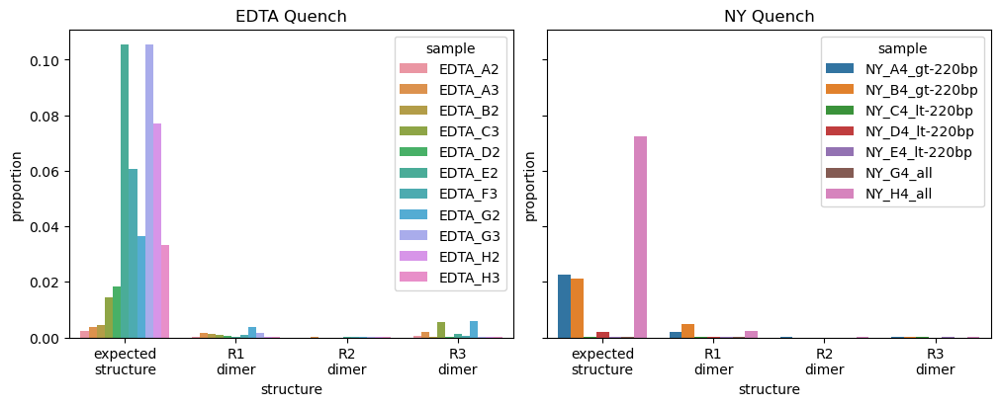

In [84]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4), sharex=False, sharey=True, constrained_layout=True)
sns.barplot(
    df_group_analysis_r2 \
        .assign(structure=df_group_analysis_r2['structure'].str.replace(' ', '\n')) \
        .loc[df_group_analysis_r2['quench'] == 'EDTA'],
    x='structure',
    y='proportion',
    hue='sample',
    ax=axs[0]
)
axs[0].set_title('EDTA Quench')
sns.barplot(
    df_group_analysis_r2 \
        .assign(structure=df_group_analysis_r2['structure'].str.replace(' ', '\n')) \
        .loc[df_group_analysis_r2['quench'] == 'NY'],
    x='structure',
    y='proportion',
    hue='sample',
    ax=axs[1]
)
axs[1].set_title('NY Quench')
fig.show()

# Count barcodes

## Splitcode

1. Add barcode and UMI to read name

   `@read::[LigEven][R1Top][LigR1][R2Top][LigR2][R3Top][LigR3][NYLigOddStgTop][Illumina] RX:Z:<UMI>`

2. Calculate barcode counts

### Config file

Only use read 1 (120 bp)

In [107]:
path_config = os.path.join(DIR_AUX, 'splitcode_config-r1_expected_structure.tsv')

# read config file into pandas DataFrame
# - seek to first line after lines starting with '@' or '#'; 
#     pd.read_csv() only supports a single character comment
# - need to open file as binary to enable f.tell() to work
with open(path_config, 'rb') as f:
    pos = f.tell()
    for line in f:
        line = line.decode().strip()
        if line.startswith('#') or line.startswith('@') or line == '':
            pos = f.tell()
            continue
        f.seek(pos)
        break
    df_config = pd.read_csv(f, sep='\t')

Check that tags do not have collisions

In [108]:
regex_distances = re.compile(r'((?P<dist_hamming>\d+):(?P<dist_indel>\d+):)?(?P<dist_total>\d+)')
variant_maps = dict()
for tag_group in df_config['groups'].unique():
    mask_tag_group = df_config['groups'] == tag_group
    seqs = set(df_config.loc[mask_tag_group, 'tags'])
    distances = df_config.loc[mask_tag_group, 'distances'].unique()
    assert len(distances) == 1
    distances = regex_distances.match(distances[0]).groupdict()
    for k in distances:
        if distances[k] is not None:
            distances[k] = int(distances[k])
    variant_maps[tag_group] = string_distances.generate_variant_map(seqs, **distances, verify_unique=True)

In [109]:
all_variants = set()
for tag_group, variants in variant_maps.items():
    assert len(set(variants.keys()) & all_variants) == 0
    all_variants |= set(variants.keys())

### Run splitcode

In [110]:
%%bash -s {DIR_DATA} {DIR_PROC} {DIR_AUX} {path_config}
DIR_DATA="$1"
DIR_PROC="$2"
DIR_AUX="$3"
PATH_CONFIG="$4"

source ~/.bashrc

for path_R1 in "$DIR_DATA"/*R1.fastq.gz; do
    SAMPLE="$(echo "$path_R1" | grep -o -E -e '(EDTA|NY)_[A-H][0-9]+.*_R1' | sed -E -e 's/_R1$//')"
    PATH_MAPPING="${DIR_PROC}/mapping-${SAMPLE}.tsv"
    PATH_SUMMARY="${DIR_PROC}/summary-${SAMPLE}.json"
    PATH_OUTPUT="${DIR_PROC}/read_barcodes-${SAMPLE}.txt.gz"

    if [ ! -f "$PATH_OUTPUT" ]; then
        splitcode -c "$PATH_CONFIG" \
            --nFastqs=1 --assign --mod-names --x-names --no-x-out --no-outb --out-fasta -t 8 \
            --mapping="$PATH_MAPPING" --summary="$PATH_SUMMARY" --output=/dev/stdout \
            "$path_R1" |
        awk '$1 ~ /^>/' |
        pigz -p 8 > "$PATH_OUTPUT"
    fi
done

* Using a list of 101 tags (vector size: 101; map size: 1,990,389; num elements in map: 2,057,653)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A2_R1.fastq.gz
* processing the reads ...
done 
* processed 26,090 reads, 4,516 reads were assigned
* Using a list of 101 tags (vector size: 101; map size: 1,990,389; num elements in map: 2,057,653)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_A3_R1.fastq.gz
* processing the reads ...
done 
* processed 80,654 reads, 28,733 reads were assigned
* Using a list of 101 tags (vector size: 101; map size: 1,990,389; num elements in map: 2,057,653)
* will process sample 1: /central/groups/guttman/btyeh/scBarcode/data/20231204/scBarcode-EDTA_B2_R1.fastq.gz
* processing the reads ...
done 
* processed 35,361 reads, 15,968 reads were assigned
* Using a list of 101 tags (vector size: 101; map size: 1,990,389; num elements in map: 2,057,653)
* will process sampl

Proportion of reads from each sample that were properly barcoded (considered "assigned" by splitcode)

In [130]:
df_data['n_assigned'] = 0
for sample in df_data['basename'].unique():
    mask_sample = df_data['basename'] == sample
    n_reads = df_data.loc[mask_sample, 'n_reads'].iloc[0]
    path_summary = os.path.join(DIR_PROC, f'summary-{sample}.json')
    with open(path_summary, 'rt') as f:
        summary = json.load(f)
    assert summary['n_processed'] == n_reads
    df_data.loc[mask_sample, 'n_assigned'] = summary['n_assigned']

In [131]:
(df_data[['basename', 'n_reads', 'n_assigned']].drop_duplicates()
    .set_index('basename')
    .pipe(lambda df: df.assign(prop_assigned=df['n_assigned'] / df['n_reads']))['prop_assigned'])

basename
EDTA_A2           0.173093
EDTA_A3           0.356250
EDTA_B2           0.451571
EDTA_C3           0.418473
EDTA_D2           0.207240
EDTA_E2           0.480709
EDTA_F3           0.357373
EDTA_G2           0.534371
EDTA_G3           0.346407
EDTA_H2           0.308250
EDTA_H3           0.199135
NY_A4_gt-220bp    0.317321
NY_B4_gt-220bp    0.274988
NY_C4_lt-220bp    0.001926
NY_D4_lt-220bp    0.009663
NY_E4_lt-220bp    0.001893
NY_G4_all         0.327546
NY_H4_all         0.347297
Name: prop_assigned, dtype: float64

## Parse identified barcodes to counts

Structure of `sample_barcode_counts` dictionary
- key: sample
- value: `sample_data`
  - key: barcode
  - value: `barcode_data`
    - key: UMI
    - value: count

Note that a handful of UMIs contain bases recorded as `N`.

In [132]:
%%bash -s {DIR_PROC}
DIR_PROC="$1"
zcat "$DIR_PROC/read_barcodes-EDTA_A2.txt.gz" | grep -E -e 'RX:Z:[ATCG]*N[ATCG]*'

>AV233703:20231204:2323517709:2:20702:2858:1622::[LigEven][R1Top_3][LigR1][R2Top_8][R3Top_11][NYLigOddStgTop_16][Illumina] RX:Z:NAGCTTCACTCA
>AV233703:20231204:2323517709:2:21905:5286:2423::[LigEven][R1Top_4][LigR1][R2Top_10][LigR2][R3Top_22][LigR3][NYLigOddStgTop_16][Illumina] RX:Z:GTTAAGNAGCGT


In [ ]:
[LigEven][R1Top][LigR1][R2Top][LigR2][R3Top][LigR3][NYLigOddStgTop][Illumina] RX:Z:<UMI>

In [134]:
regex_oligo_cell_barcode = re.compile((
    r'(?P<barcode>'
    r'\[R1Top_(?P<R1>\d+)\]'
    r'\[LigR1\]'
    r'\[R2Top_(?P<R2>\d+)\]'
    r'\[LigR2\]'
    r'\[R3Top_(?P<R3>\d+)\]'
    r'\[LigR3\]'
    r'\[NYLigOddStgTop_(?P<Y>\d+)\])'
))
regex_umi = re.compile(r'RX:Z:([ATCGN]+)')

In [140]:
sample_barcode_counts = dict()
sample_barcode_inconsistencies = []
path_barcode_inconsistencies = os.path.join(DIR_PROC, 'barcode_inconsistencies.csv')
for sample in df_data['basename'].unique():
    path_read_barcodes = os.path.join(DIR_PROC, f'read_barcodes-{sample}.txt.gz')
    path_barcode_counts = os.path.join(DIR_PROC, f'barcode_counts-{sample}.json.gz')
    if not os.path.exists(path_barcode_counts):
        sample_data = dict()
        no_match = 0
        no_umi = 0
        bad_umi = 0
        with gzip.open(path_read_barcodes, 'rt') as f:
            for name in f:
                name = name.strip()
                match = regex_oligo_cell_barcode.search(name)
                if match:
                    tags = match.groupdict()
                    barcode = tags['barcode']
                    umi = regex_umi.search(name)
                    if umi is None:
                        no_umi += 1
                        continue
                    else:
                        umi = umi.group(1)
                        if 'N' in umi:
                            bad_umi += 1
                            continue
                    if barcode not in sample_data:
                        sample_data[barcode] = collections.defaultdict(int)
                    sample_data[barcode][umi] += 1
                else:
                    no_match += 1
        with gzip.open(path_barcode_counts, 'wt') as f:
            json.dump(sample_data, f)
        sample_barcode_inconsistencies.append({
            'sample': sample,
            'no_match': no_match,
            'no_umi': no_umi,
            'bad_umi': bad_umi
        })
    else:
        print(f'{sample}: loading existing counts')
        with gzip.open(path_barcode_counts, 'rt') as f:
            sample_data = json.load(f)
    sample_barcode_counts[sample] = sample_data

In [141]:
if len(sample_barcode_inconsistencies) > 0:
    sample_barcode_inconsistencies = pd.DataFrame(sample_barcode_inconsistencies)
    sample_barcode_inconsistencies.to_csv(path_barcode_inconsistencies)
else:
    sample_barcode_inconsistencies = pd.read_csv(path_barcode_inconsistencies)

In [142]:
print('no_match = reads with missing tags')
print('no_umi = reads lacking 12 bp UMI')
print('bad_umi = reads whose UMIs contain \'N\'')
display(sample_barcode_inconsistencies)

no_match = reads with missing tags
no_umi = reads lacking 12 bp UMI
bad_umi = reads whose UMIs contain 'N'


,sample,no_match,no_umi,bad_umi
0,EDTA_A2,1489,171,1
1,EDTA_A3,8893,1145,14
2,EDTA_B2,4265,495,8
3,EDTA_C3,8439,553,13
4,EDTA_D2,14722,1598,12
5,EDTA_E2,12927,1268,32
6,EDTA_F3,3774,747,7
7,EDTA_G2,3168,400,8
8,EDTA_G3,6691,1039,11
9,EDTA_H2,4980,573,6


In [143]:
print(
    'Total number of read pairs with correct barcode structure:',
    sum(
        sum(barcode_data.values())
        for sample_data in sample_barcode_counts.values()
        for barcode_data in sample_data.values()))

Total number of read pairs with correct barcode structure: 284542


### Parse barcode counts to DataFrames

- `df_umi_counts`: closest representation of raw data; counts per [[barcode + UMI]]
  - format: wide
  - `id_vars`: `sample`, `R1`, `R2`, `R3`, `umi`
  - `value_vars`: `count`
- `df_barcode_counts`: counts (both undeduplicated and deduplicated by UMI) per [[barcode]]
  - format: wide
  - `id_vars`: `sample`, `R1`, `R2`, `R3`
  - `value_vars`: `count`, `count_dedup`
- `df_tag_counts`: counts per [[tag]]
  - format: long
  - `id_vars`: `sample`, `round`, `tag`, `deduplication`
  - `value_vars`: `count`

In [144]:
df_umi_counts = []
for sample, sample_data in sample_barcode_counts.items():
    for barcode, barcode_data in sample_data.items():
        for umi, count in barcode_data.items():
            df_umi_counts.append([sample, barcode, umi, count])
df_umi_counts = pd.DataFrame(df_umi_counts, columns=['sample', 'barcode', 'umi', 'count']) \
    .astype(dict(sample='category'))

In [151]:
df_umi_counts = pd.concat(
    (
        df_umi_counts.drop(columns='barcode'),
        df_umi_counts["barcode"].str.extract((
            r'\[R1Top_(?P<R1>\d+)\]'
            r'(?:\[LigR1\])?'
            r'\[R2Top_(?P<R2>\d+)\]'
            r'(?:\[LigR2\])?'
            r'\[R3Top_(?P<R3>\d+)\]'
            r'(?:\[LigR3\])?'
            r'\[NYLigOddStgTop_(?P<Y>\d+)\]'
        ))),
    axis=1
).astype(dict(R1=np.uint8, R2=np.uint8, R3=np.uint8, Y=np.uint8))

In [152]:
df_barcode_counts = (
    df_umi_counts.groupby(["sample"] + ROUNDS, observed=True)["count"]
    .agg(["count", "sum"])
    .reset_index()
    .rename(columns={"count": "count_dedup", "sum": "count"})
)

In [153]:
df_tag_counts = (
    df_barcode_counts
    .melt(
        id_vars=["sample", "count", "count_dedup"],
        value_vars=ROUNDS,
        var_name="round",
        value_name="tag")
    .groupby(["sample", "round", "tag"], observed=True)
    .agg({"count": "sum", "count_dedup": "sum"})
    .reset_index()
    .rename(columns={"count": "no", "count_dedup": "yes"})
    .melt(
        id_vars=["sample", "round", "tag"],
        value_vars=["yes", "no"],
        var_name="deduplication",
        value_name="count")
    .astype(dict(round="category", deduplication="category")))

### Check for tags that are missing from this dataset

The R1, R2, or R3 have no missing tags, as expected.

Oddly, NYLigOdd tags 6, 11, 12, and 24 are rare/missing.

In [28]:
expected_tags = {
    'R1': set(range(1, 25)),
    'R2': set(range(1, 25)),
    'R3': set(range(1, 25))}

In [29]:
df_missing_tags = []
assert (df_tag_counts['count'] > 0).all()
for sample, group in df_tag_counts.groupby('sample'):
    for r in ROUNDS:
        missing_tags = expected_tags[r] - set(group.loc[group['round'] == r, 'tag'])
        rare_tags = set(group.loc[
            (group['round'] == r) &
            (group['deduplication'] == 'yes') &
            (group['count'] > 0) &
            (group['count'] < 50),
            'tag'])
        assert len(missing_tags & rare_tags) == 0
        df_missing_tags.append(dict(
            sample=sample,
            round=r,
            missing_tags=missing_tags,
            rare_tags=rare_tags))
df_missing_tags = pd.DataFrame(df_missing_tags).sort_values(['round', 'sample'])
df_missing_tags

,sample,round,missing_tags,rare_tags
0,A3,R1,{},{}
3,A4,R1,{},{}
6,A5,R1,{},{}
9,B3,R1,{},{}
12,C3,R1,{},{}
15,C5,R1,{},{}
18,D3,R1,{},{}
1,A3,R2,{},{}
4,A4,R2,{},{}
7,A5,R2,{},{}


# (TBR) Sequencing Depth and Duplicates

## UMI distribution

In [30]:
with pd.option_context('display.float_format', '{:,g}'.format):
    display(df_umi_counts['count'].describe())

count   1.19642e+07
mean        1.31043
std        0.613069
min               1
25%               1
50%               1
75%               1
max              11
Name: count, dtype: float64

Distribution of UMIs per sample

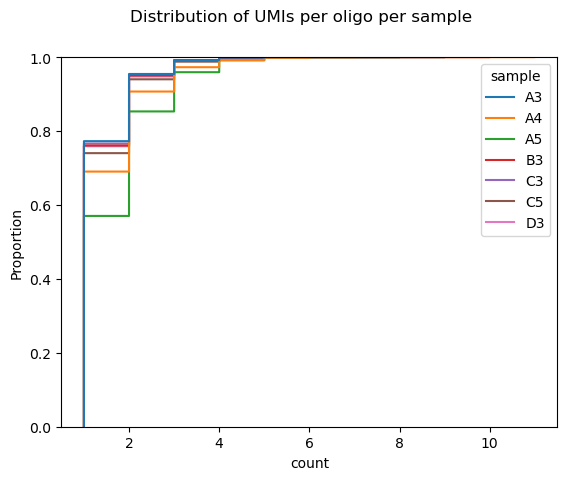

In [31]:
ax = sns.ecdfplot(
    df_umi_counts,
    x='count',
    hue='sample')
ax.figure.suptitle('Distribution of UMIs per oligo per sample')
ax.figure.show()

### Estimate library complexity from sequencing/UMI duplicates

Note: The current method of library complexity estimation assumes that the number of available UMIs far exceeds the number of unique molecules, and therefore underestimates the true library complexity. A better model would account for the possibility of real UMI collisions, and as a consequence of PCR duplicates/sequencing.

In [32]:
def estimate_library_complexity(count_total, count_dedup, max_err=1e-3):
    '''
    See https://github.com/bentyeh/resources/blob/main/bioinformatics/models_genomics.md
    '''
    res = scipy.optimize.minimize_scalar(
      fun=lambda M: (M * (1 - np.exp(-count_total/M)) - count_dedup)**2,
      bracket=(count_dedup, count_total*2)
    )
    assert res.fun < max_err
    return res.x

In [33]:
umi_complexity = 4**12
print('Maximum UMI complexity:', umi_complexity)

Maximum UMI complexity: 16777216


#### Option 1: From all barcodes per sample

In [34]:
complexity_umi_all = df_barcode_counts.groupby('sample')[['count', 'count_dedup']].sum().apply(
    lambda s: estimate_library_complexity(s['count'], s['count_dedup']),
    axis=1)

#### Option 2: From predominant barcode per sample

In [35]:
top_barcode_counts = (
    df_barcode_counts
    .groupby("sample", group_keys=True)
    .apply(lambda group: group.loc[group["count"] == group["count"].max(), ["count", "count_dedup"]])
    .droplevel(1, axis=0))

In [36]:
complexity_umi_top = top_barcode_counts.apply(
    lambda s: estimate_library_complexity(s["count"], s["count_dedup"]), axis=1)

#### Plot

In [37]:
df_data = df_data.merge(
    pd.concat(
        (
            complexity_umi_top.rename("complexity_umi_est_top"),
            complexity_umi_all.rename("complexity_umi_est_all"),
            df_umi_counts.groupby('sample')['count'].count().rename("complexity_obs"),
        ),
        axis=1,
    ).reset_index(),
    how="left",
    on="sample",
)

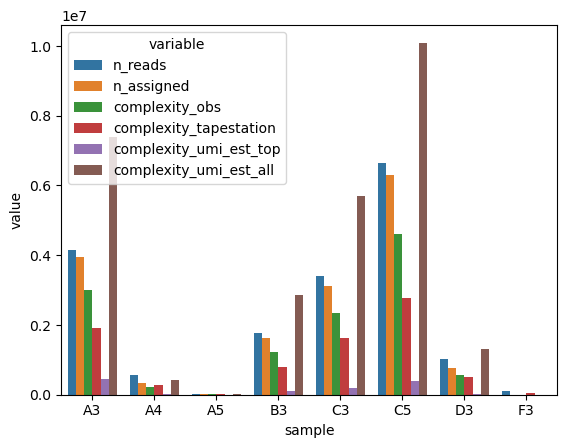

In [38]:
ax = sns.barplot(
    df_data[['sample', 'n_reads', 'n_assigned', 'complexity_obs', 'complexity_tapestation', 'complexity_umi_est_top', 'complexity_umi_est_all']] \
        .drop_duplicates() \
        .melt(id_vars='sample'),
    x='sample',
    y='value',
    hue='variable')

#### Estimated coverage and duplication rate

"Coverage" = proportion of physical molecules that were sequenced and assigned.
- Assume sampling `n_assigned` reads from `complexity_tapestation` molecules.

In [39]:
df_data[['sample', 'n_assigned', 'complexity_tapestation']].drop_duplicates() \
    .set_index('sample')\
    .apply(
        lambda s: 1 - scipy.stats.binom.pmf(0, n=s['n_assigned'], p=1/s['complexity_tapestation']),
        axis=1) \
    .rename('coverage')

sample
A3    0.873819
A4    0.710524
A5    0.587271
B3    0.870799
C3    0.852320
C5    0.896294
D3    0.780152
F3    0.000000
Name: coverage, dtype: float64

Duplication rate = proportion of sequenced and assigned reads that are duplicates

In [40]:
df_barcode_counts.groupby('sample')[['count_dedup', 'count']].sum().pipe(
    lambda df: df.assign(**{
        'duplication rate': (df['count'] - df['count_dedup'])/df['count_dedup']}))

,count_dedup,count,duplication rate
sample,,,
A3,2992182,3837290,0.282439
A4,226362,326257,0.441306
A5,13803,22478,0.628487
B3,1210888,1573756,0.299671
C3,2356277,3041243,0.290698
C5,4599621,6139320,0.334745
D3,565064,737862,0.305803


In [41]:
df_data[['sample', 'n_assigned', 'complexity_tapestation']].drop_duplicates() \
    .set_index('sample')\
    .apply(
        lambda s:
            scipy.stats.binom.mean(n=s['n_assigned'], p=1/s['complexity_tapestation']) / \
            (1 - scipy.stats.binom.pmf(0, n=s['n_assigned'], p=1/s['complexity_tapestation'])),
        axis=1) \
    .map(lambda s: (s - 1) / s) \
    .rename('duplication rate')

/tmp/ipykernel_9421/2906528009.py:5: RuntimeWarning: invalid value encountered in double_scalars
  scipy.stats.binom.mean(n=s['n_assigned'], p=1/s['complexity_tapestation']) / \


sample
A3    0.577873
A4    0.426849
A5    0.336377
B3    0.574470
C3    0.554391
C5    0.604493
D3    0.484987
F3         NaN
Name: duplication rate, dtype: float64

# Ligation QC

| Round    | Tags used (wells) | Tags used (ID) | Tags added during pooling | Pooling orientation     |
| -------- | ----------------- | -------------- | ------------------------- | ----------------------- |
| R1       | A1-A11, B1-B11    | 1-11, 13-23    | A12 (12), B12 (24)        | 12 apart                |
| R2       | C1-C11, D1-D11    | 1-11, 13-23    | C12 (12), D12 (24)        | symmetric around C12/D1 |
| R3       | E1-E11, F1-F11    | 1-11, 13-23    | E12 (12), F12 (24)        | 12 apart                |

In [42]:
rounds_to_pooled_tags = {
    'R1': (12, 24),
    'R2': (12, 24),
    'R3': (12, 24)
}

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


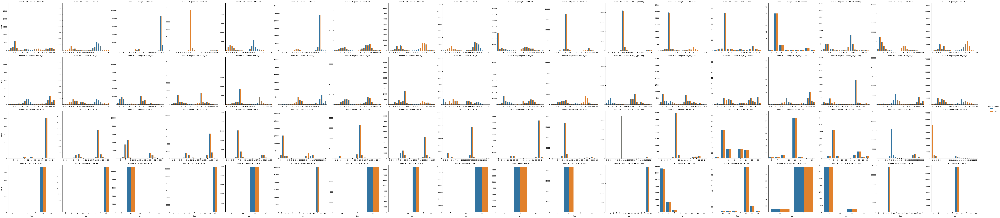

In [154]:
g = sns.catplot(
    df_tag_counts,
    kind='bar',
    x='tag',
    y='count',
    row='round',
    row_order=ROUNDS,
    hue='deduplication',
    col='sample',
    sharex=False,
    sharey='col')

# red color for xticklabels corresponding to tags added during pooling
# for (r, sample), ax in g.axes_dict.items():
#     for text in ax.get_xticklabels():
#         if int(text.get_text()) in rounds_to_pooled_tags[r]:
#             text.set_color('red')
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# g.figure.set_size_inches(25, 18)

# g.figure.savefig(
#     os.path.join(DIR_RESULTS, 'tag_counts_by_sample.pdf'),
#     bbox_inches='tight',
#     dpi=300)

In [155]:
g.figure.savefig(
    os.path.join(DIR_RESULTS, 'tag_counts_by_sample.pdf'),
    bbox_inches='tight')

## Flow diagram

In [156]:
for sample in df_barcode_counts['sample'].unique():
    fig = go.Figure(go.Parcats(
        dimensions=[{'label': r, 'values': df_barcode_counts.loc[df_barcode_counts['sample'] == sample, r]} for r in ROUNDS],
        counts=df_barcode_counts.loc[df_barcode_counts['sample'] == sample, 'count_dedup']))
    fig.update_layout(
        title_text=f'Sample: {sample}',
        width=600,
        height=600,
        margin=dict(l=10, b=10, t=50, r=10)
    )
    fig.show()
    fig.write_image(os.path.join(DIR_RESULTS, f'parcats_{sample}.pdf'))

## (TBD) Ligation of pooled tags

1. (Distribution over samples) For a given round, what proportion of tags were pooled tags?
2. (Distribution over samples) For a given round, what proportion of tags were accounted by each pooled tag?
4. (Distribution over samples) For a given partial (2 out of 3 rounds) barcode, what proportion of the "missing" round is made up of pooled tags?

In [46]:
df_pooled_tags_counts = (
    df_tag_counts
    .groupby(["sample", "round", "deduplication"], group_keys=False)
    .apply(lambda group: (
        group
        .assign(total=group["count"].sum())
        .loc[group["tag"].isin(rounds_to_pooled_tags[group.iloc[0]["round"]])]))
    .pipe(lambda df: df.assign(proportion=df['count']/df['total']))
    .sort_values(['deduplication', 'round', 'sample', 'proportion'])
    .reset_index(drop=True)
)

In [47]:
# assert that the number of counts observed at each round is the same for all samples
assert df_pooled_tags_counts.groupby(['sample', 'deduplication'])['total'].agg(lambda x: len(np.unique(x)) == 1).all()

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



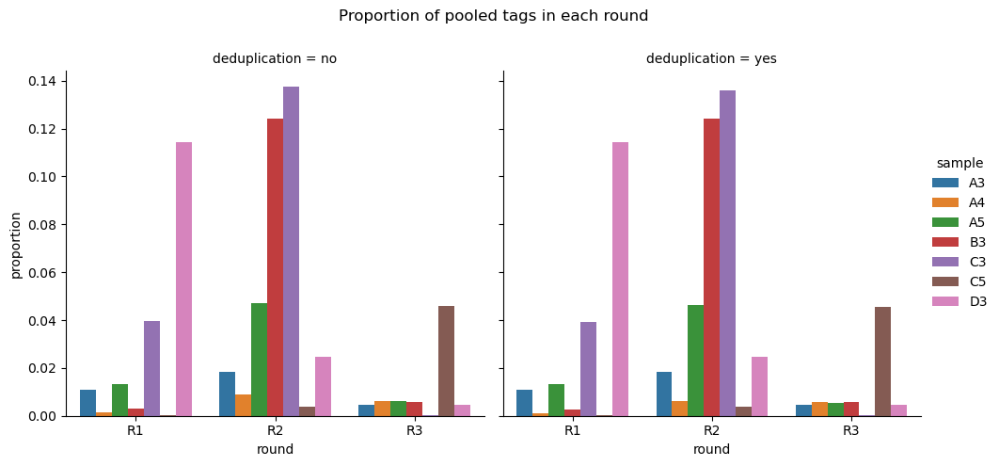

In [48]:
g = sns.catplot(
    df_pooled_tags_counts.groupby(['sample', 'round', 'deduplication'], as_index=False)['proportion'].sum(),
    kind='bar',
    x='round',
    y='proportion',
    hue='sample',
    col='deduplication')
g.figure.subplots_adjust(top=0.85)
g.figure.suptitle('Proportion of pooled tags in each round')
g.figure.show()

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



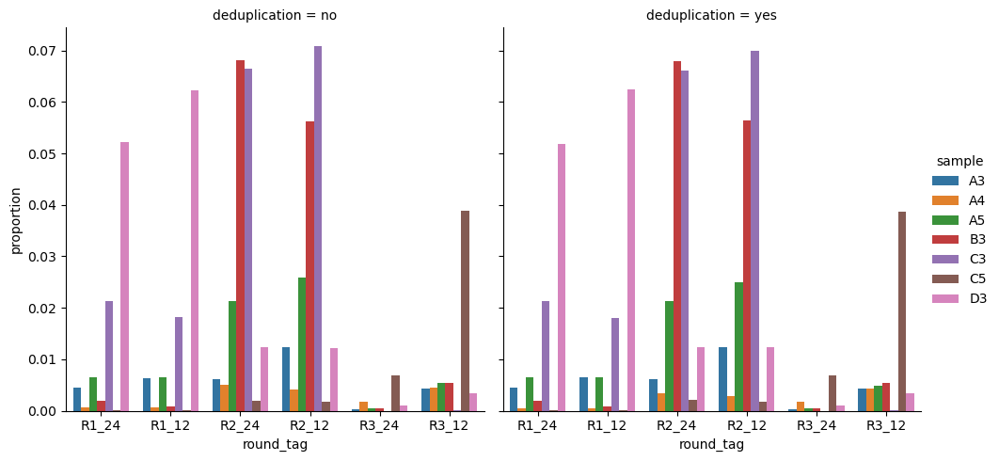

In [49]:
sns.catplot(
    df_pooled_tags_counts.assign(
        round_tag=df_pooled_tags_counts['round'].str.cat(df_pooled_tags_counts['tag'].astype(str), sep='_')),
    kind='bar',
    x='round_tag',
    y='proportion',
    hue='sample',
    col='deduplication')
g.figure.subplots_adjust(top=0.85)
g.figure.suptitle('Proportion of pooled tags in each round')
g.figure.show()

In [50]:
df_pooled_tag_proportion_per_partial_barcode = []
for i in range(len(ROUNDS)):
    partial_rounds = ROUNDS[:i] + ROUNDS[i+1:]
    pooled_round = ROUNDS[i]
    df_pooled_tag_proportion_per_partial_barcode.append((
        df_barcode_counts
        .groupby(['sample'] + partial_rounds, observed=True, as_index=False)
        .apply(lambda group:
               group.loc[group[pooled_round].isin(rounds_to_pooled_tags[pooled_round]), ['count', 'count_dedup']].sum(axis=0) / 
               group[['count', 'count_dedup']].sum(axis=0))
        .assign(**{pooled_round: -1, 'round': pooled_round})
        .rename(columns={'count': 'proportion', 'count_dedup': 'proportion_dedup'})
    ))
df_pooled_tag_proportion_per_partial_barcode = pd.concat(df_pooled_tag_proportion_per_partial_barcode) \
    .astype(dict(round='category'))

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



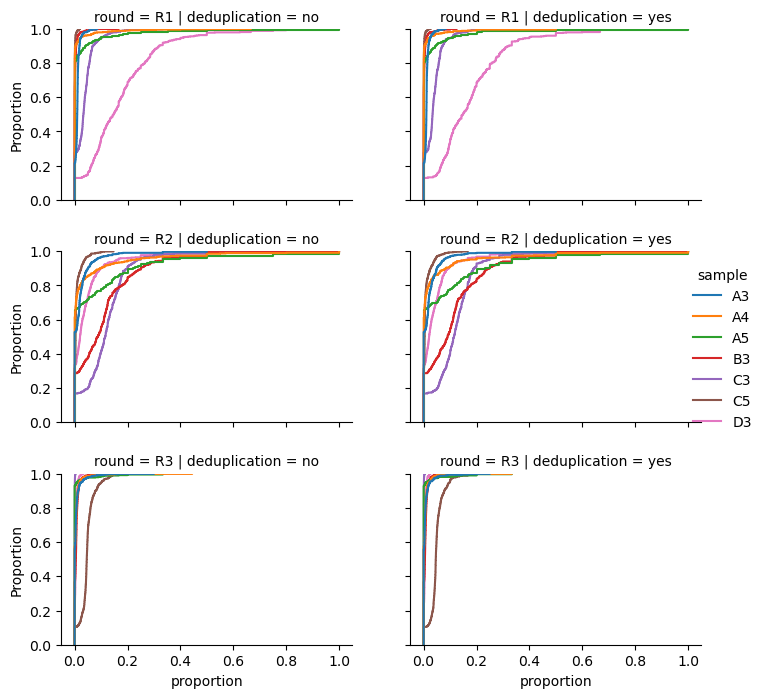

In [51]:
g = sns.displot(
    kind='ecdf',
    data=(
        df_pooled_tag_proportion_per_partial_barcode
        .rename(columns={'proportion': 'no', 'proportion_dedup': 'yes'}) \
        .melt(id_vars=['sample', 'round'],
              value_vars=['no', 'yes'],
              var_name='deduplication',
              value_name='proportion')),
    x='proportion',
    hue='sample',
    row='round',
    row_order=ROUNDS,
    col='deduplication',
    facet_kws={'gridspec_kws': dict(hspace=0.3)})
g.figure.set_size_inches((8, 8))

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



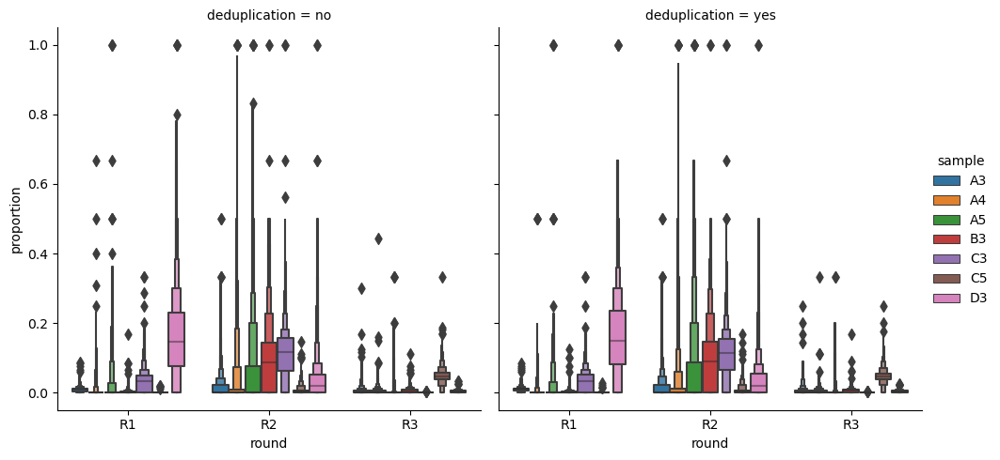

In [52]:
sns.catplot(
    kind='boxen',
    data=df_pooled_tag_proportion_per_partial_barcode \
        .rename(columns={'proportion': 'no', 'proportion_dedup': 'yes'}) \
        .melt(id_vars=['sample', 'round'],
              value_vars=['no', 'yes'],
              var_name='deduplication',
              value_name='proportion'),
    x='round',
    y='proportion',
    hue='sample',
    col='deduplication')

## (TBR) Independence of each round

In [53]:
df_rounds_independence = []
for r1, r2 in itertools.combinations(ROUNDS, 2):
    for sample, group in df_barcode_counts.groupby('sample'):
        pvalue = scipy.stats.chi2_contingency((
            group
            .groupby([r1, r2], observed=True, as_index=False)['count'].sum()
            .pivot(columns=r2, index=r1)
            .fillna(0)
            .values
        )).pvalue
        df_rounds_independence.append(dict(sample=sample, r1=r1, r2=r2, pvalue=pvalue))
df_rounds_independence = pd.DataFrame(df_rounds_independence)

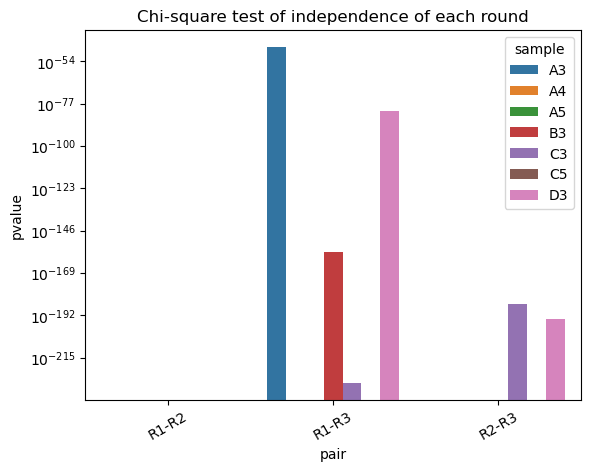

In [54]:
ax = sns.barplot(
    df_rounds_independence.assign(pair=df_rounds_independence['r1'].str.cat(df_rounds_independence['r2'], sep='-')),
    x='pair',
    y='pvalue',
    hue='sample')
ax.set_yscale('log')
ax.tick_params(axis='x', labelrotation=30)
ax.set_title('Chi-square test of independence of each round')
ax.figure.show()

# Analyze barcode count distributions

Structure of `dist_oligos` and `dist_unique_oligos` dictionaries
- key: sample
- value: pandas.Series of barcode counts

In [157]:
dist_oligos = {}
dist_unique_oligos = {}
for sample, sample_data in sample_barcode_counts.items():
    dist_oligos[sample] = pd.Series(sum(barcode_data.values()) for barcode_data in sample_data.values())
    dist_unique_oligos[sample] = pd.Series(map(len, sample_data.values()))

In [158]:
for sample, sample_data in sample_barcode_counts.items():
    print(f'Number of barcodes in sample {sample}:', len(sample_data))
    print('Frequency of most common barcodes:', dist_oligos[sample].sort_values(ascending=False).values[:10])
    print('Frequency of most common barcodes (dedup):', dist_unique_oligos[sample].sort_values(ascending=False).values[:10])
    print()

Number of barcodes in sample EDTA_A2: 611
Frequency of most common barcodes: [176  84  55  50  47  43  42  32  32  29]
Frequency of most common barcodes (dedup): [175  84  55  50  47  43  42  32  32  29]

Number of barcodes in sample EDTA_A3: 2390
Frequency of most common barcodes: [435 400 315 315 289 226 187 182 182 170]
Frequency of most common barcodes (dedup): [433 400 315 315 288 226 187 182 182 170]

Number of barcodes in sample EDTA_B2: 744
Frequency of most common barcodes: [711 541 535 535 490 435 386 356 337 285]
Frequency of most common barcodes (dedup): [709 541 535 535 489 435 386 356 337 285]

Number of barcodes in sample EDTA_C3: 638
Frequency of most common barcodes: [1949 1728  439  368  349  268  267  251  200  197]
Frequency of most common barcodes (dedup): [1948 1726  439  368  349  268  267  250  200  197]

Number of barcodes in sample EDTA_D2: 2162
Frequency of most common barcodes: [1519  812  770  748  624  485  433  407  385  383]
Frequency of most common barc

In [159]:
df_dist_oligos = pd.concat(
    [
        s.rename("count")
        .to_frame()
        .pipe(
            lambda df: df.assign(
                **dict(sample=sample, proportion=df["count"] / df["count"].sum())
            )
            .sort_values("count", ascending=False)
            .assign(barcode_rank=range(1, len(df) + 1))
        )
        for sample, s in dist_oligos.items()
    ],
    axis=0,
).astype(dict(sample="category"))


df_dist_unique_oligos = pd.concat(
    [
        s.rename("count")
        .to_frame()
        .pipe(
            lambda df: df.assign(
                **dict(sample=sample, proportion=df["count"] / df["count"].sum())
            )
            .sort_values("count", ascending=False)
            .assign(barcode_rank=range(1, len(df) + 1))
        )
        for sample, s in dist_unique_oligos.items()
    ],
    axis=0,
).astype(dict(sample="category"))

### Count (or proportion of total count) per barcode (akin to scSPRITE Figure 1C)

/home/btyeh/miniconda3/envs/py3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



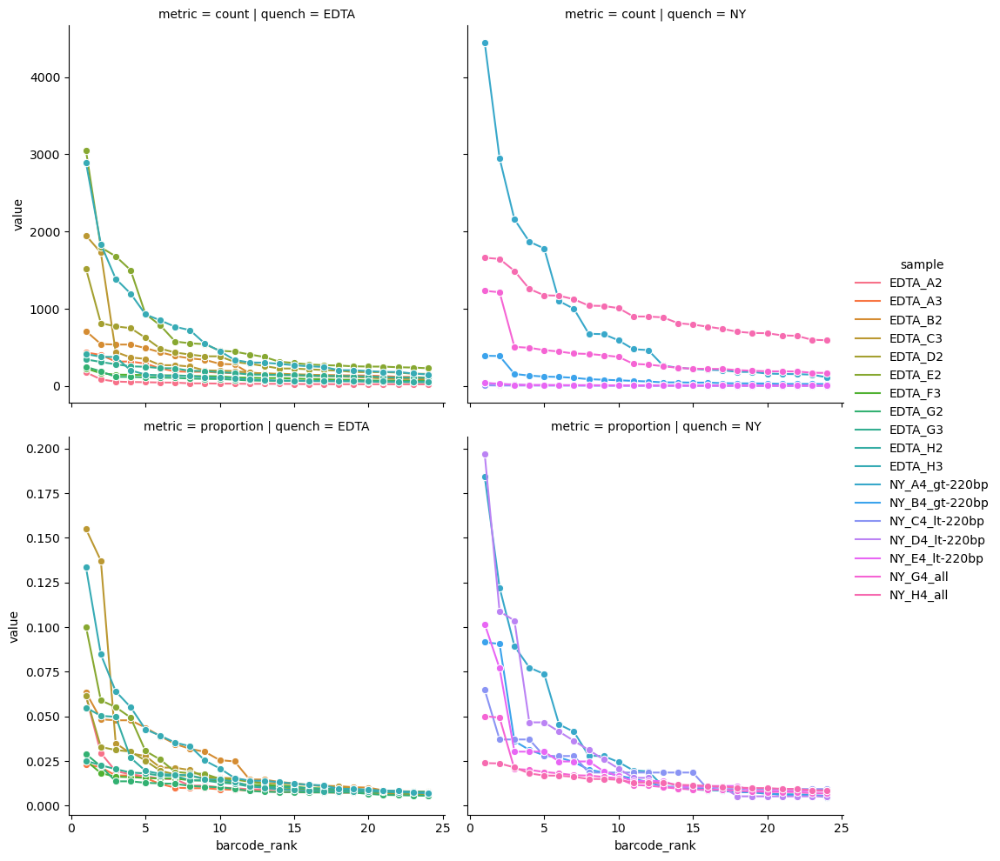

In [171]:
g = sns.relplot(
    kind='line',
    data=(
        df_dist_unique_oligos
        .assign(quench=df_dist_unique_oligos['sample'].str.extract('^([^_]+)'))
        .loc[df_dist_unique_oligos['barcode_rank'] < 25]
        .melt(id_vars=['sample', 'barcode_rank', 'quench'], var_name='metric')
    ),
    x='barcode_rank',
    y='value',
    hue='sample',
    col='quench',
    row='metric',
    marker='o',
    facet_kws=dict(sharey='row')
)

g.figure.savefig(
    os.path.join(DIR_RESULTS, 'barcode_count_by_barcode_rank.png'),
    dpi=300,
    bbox_inches='tight')